In [1]:
# import lib
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OrdinalEncoder
from sklearn.linear_model import LogisticRegression
from plotly import __version__
import plotly.offline as offline
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
from plotly.graph_objs import *
import colorlover as cl
from plotly import tools
colors = ['#e43620', '#f16d30','#d99a6c','#fed976', '#b3cb95', '#41bfb3','#229bac',
'#256894', '#fed936', '#f36d30', '#b3cb25', '#f14d30','#49bfb5','#252bac',]

In [2]:
# import data
columns = pd.read_csv('D:\MLExercise\MLExercise\census-income.columns', names=["column"], header=None)
col_name = []
for name in columns['column']:
    col_name.append(name)
income = pd.read_csv('D:\MLExercise\MLExercise\census-income.data', names=col_name, header=None)
income.head()

,age,class of worker,detailed industry recode,detailed occupation recode,education,wage per hour,enroll in edu inst last wk,marital stat,major industry code,major occupation code,...,country of birth father,country of birth mother,country of birth self,citizenship,own business or self employed,fill inc questionnaire for veteran's admin,veterans benefits,weeks worked in year,year,label
0,73,Not in universe,0,0,High school graduate,0,Not in universe,Widowed,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,0,95,- 50000.
1,58,Self-employed-not incorporated,4,34,Some college but no degree,0,Not in universe,Divorced,Construction,Precision production craft & repair,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,2,52,94,- 50000.
2,18,Not in universe,0,0,10th grade,0,High school,Never married,Not in universe or children,Not in universe,...,Vietnam,Vietnam,Vietnam,Foreign born- Not a citizen of U S,0,Not in universe,2,0,95,- 50000.
3,9,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.
4,10,Not in universe,0,0,Children,0,Not in universe,Never married,Not in universe or children,Not in universe,...,United-States,United-States,United-States,Native- Born in the United States,0,Not in universe,0,0,94,- 50000.


In [3]:
income.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 199523 entries, 0 to 199522
Data columns (total 42 columns):
 #   Column                                      Non-Null Count   Dtype  
---  ------                                      --------------   -----  
 0   age                                         199523 non-null  int64  
 1   class of worker                             199523 non-null  object 
 2   detailed industry recode                    199523 non-null  int64  
 3   detailed occupation recode                  199523 non-null  int64  
 4   education                                   199523 non-null  object 
 5   wage per hour                               199523 non-null  int64  
 6   enroll in edu inst last wk                  199523 non-null  object 
 7   marital stat                                199523 non-null  object 
 8   major industry code                         199523 non-null  object 
 9   major occupation code                       199523 non-null  object 
 

In [4]:
# check number of null
income.apply(lambda x:np.sum(x=='?'))

age                                               0
class of worker                                   0
detailed industry recode                          0
detailed occupation recode                        0
education                                         0
wage per hour                                     0
enroll in edu inst last wk                        0
marital stat                                      0
major industry code                               0
major occupation code                             0
race                                              0
hispanic origin                                   0
sex                                               0
member of a labor union                           0
reason for unemployment                           0
full or part time employment stat                 0
capital gains                                     0
capital losses                                    0
dividends from stocks                             0
tax filer st

In [5]:
# delete columns that have too many null values
income.drop('migration code-change in msa',axis=1, inplace=True)
income.drop('migration code-change in reg',axis=1, inplace=True)
income.drop('migration code-move within reg',axis=1, inplace=True)
income.drop('migration prev res in sunbelt',axis=1, inplace=True)

# delete instance weight
income.drop('instance weight',axis=1, inplace=True)

# delete features that would weaken the interpretability of segmentation
income.drop('detailed industry recode',axis=1, inplace=True)
income.drop('detailed occupation recode',axis=1, inplace=True)

In [6]:
# replace '?' with NA
income = income.replace(regex=[r'\?'],value=np.nan)

In [7]:
# replace NA with the most common values of each columns
values = {'hispanic origin': income['hispanic origin'].mode()[0], 'state of previous residence': income['state of previous residence'].mode()[0], 'country of birth father': income['country of birth father'].mode()[0], 'country of birth mother': income['country of birth mother'].mode()[0], 'country of birth self': income['country of birth self'].mode()[0]}

In [8]:
income['education'].value_counts()

High school graduate                      48407
Children                                  47422
Some college but no degree                27820
Bachelors degree(BA AB BS)                19865
7th and 8th grade                          8007
10th grade                                 7557
11th grade                                 6876
Masters degree(MA MS MEng MEd MSW MBA)     6541
9th grade                                  6230
Associates degree-occup /vocational        5358
Associates degree-academic program         4363
5th or 6th grade                           3277
12th grade no diploma                      2126
1st 2nd 3rd or 4th grade                   1799
Prof school degree (MD DDS DVM LLB JD)     1793
Doctorate degree(PhD EdD)                  1263
Less than 1st grade                         819
Name: education, dtype: int64

In [9]:
# standardize education value to enhance the interpretability of grouping
# divided into two categories, high school degree and below, bachelor degree and above
income['education'].replace('Children', 0, inplace=True)
income['education'].replace('7th and 8th grade', 0, inplace=True)
income['education'].replace('10th grade', 0, inplace=True)
income['education'].replace('11th grade', 0, inplace=True)
income['education'].replace('9th grade', 0, inplace=True)
income['education'].replace('5th or 6th grade', 0, inplace=True)
income['education'].replace('12th grade no diploma', 0, inplace=True)
income['education'].replace('1st 2nd 3rd or 4th grade', 0, inplace=True)
income['education'].replace('Less than 1st grade', 0, inplace=True)
income['education'].replace('High school graduate', 0, inplace=True)
income['education'].replace('Bachelors degree(BA AB BS)', 1, inplace=True)
income['education'].replace('Some college but no degree', 1, inplace=True)
income['education'].replace('Associates degree-occup /vocational', 1, inplace=True)
income['education'].replace('Associates degree-academic program', 1, inplace=True)
income['education'].replace('Prof school degree (MD DDS DVM LLB JD)', 1, inplace=True)
income['education'].replace('Masters degree(MA MS MEng MEd MSW MBA)', 1, inplace=True)
income['education'].replace('Doctorate degree(PhD EdD)', 1, inplace=True)

In [10]:
income['education'].value_counts()

0    132520
1     67003
Name: education, dtype: int64

In [11]:
# convert value
for feature in income.columns:
    if income[feature].dtype == 'object':
        income[feature] = pd.Categorical(income[feature]).codes

In [12]:
# select data and label
X_df = income.iloc[:,income.columns != 'label']
y_df = income.iloc[:,income.columns == 'label']

X = np.array(X_df)
y = np.array(y_df)

In [13]:
# standardize data
scaler = StandardScaler()
X = scaler.fit_transform(X)

In [14]:
# feature selection, here I use DecisionTreesClassifier to judge the importance of feature variables
from sklearn.tree import DecisionTreeClassifier

In [15]:
# fit an Extra Tree model to the data
tree = DecisionTreeClassifier(random_state=0)
tree.fit(X, y)

DecisionTreeClassifier(random_state=0)

In [16]:
# show feature importance
relval = tree.feature_importances_
trace = Bar(x = X_df.columns.tolist(), y = relval, text = [round(i,2) for i in relval], textposition= "outside", marker = dict(color = colors))
iplot(Figure(data = [trace], layout = Layout(title="Feature importance", width = 800, height = 400, yaxis = dict(range = [0,0.25]))))

In [17]:
# we can see that age, capital gain, dividends form stocks and weeks worked in year are most important features.

In [18]:
# Recursive feature elimination(RFE)
from sklearn.feature_selection import RFE

# choose decisiontree
lr = DecisionTreeClassifier()
names = X_df.columns.tolist()

# Sort all features
selector = RFE(lr, n_features_to_select = 4)
selector.fit(X,y.ravel())

print("Sorted features：",sorted(zip(map(lambda x:round(x,4), selector.ranking_), names)))

Sorted features： [(1, 'age'), (1, 'capital gains'), (1, 'dividends from stocks'), (1, 'weeks worked in year'), (2, 'major industry code'), (3, 'major occupation code'), (4, 'num persons worked for employer'), (5, 'full or part time employment stat'), (6, 'capital losses'), (7, 'country of birth father'), (8, 'detailed household and family stat'), (9, 'sex'), (10, 'class of worker'), (11, 'tax filer stat'), (12, 'country of birth mother'), (13, 'live in this house 1 year ago'), (14, 'member of a labor union'), (15, 'education'), (16, 'own business or self employed'), (17, 'marital stat'), (18, 'wage per hour'), (19, 'race'), (20, 'country of birth self'), (21, 'state of previous residence'), (22, 'year'), (23, 'detailed household summary in household'), (24, 'hispanic origin'), (25, 'citizenship'), (26, 'region of previous residence'), (27, "fill inc questionnaire for veteran's admin"), (28, 'reason for unemployment'), (29, 'veterans benefits'), (30, 'enroll in edu inst last wk'), (31, 

In [19]:
# get new data
X_df_new = X_df.iloc[:, selector.get_support(indices = False)]
new_income = X_df_new
new_income['label'] = y_df['label']
new_income

D:\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,age,capital gains,dividends from stocks,weeks worked in year,label
0,73,0,0,0,0
1,58,0,0,52,0
2,18,0,0,0,0
3,9,0,0,0,0
4,10,0,0,0,0
...,...,...,...,...,...
199518,87,0,0,0,0
199519,65,6418,9,52,0
199520,47,0,157,52,0
199521,16,0,0,0,0


Text(0.5, 0, 'Age')

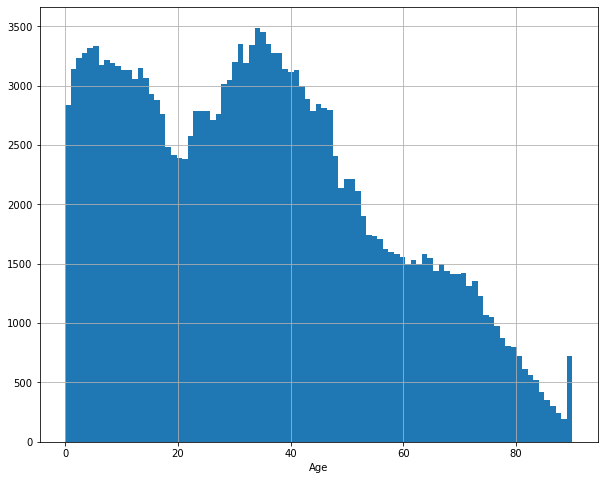

In [20]:
plt.figure(figsize=(10, 8))
new_income['age'].hist(bins=new_income['age'].nunique())
plt.xlabel('Age')

Text(0.5, 0, 'Capital gains')

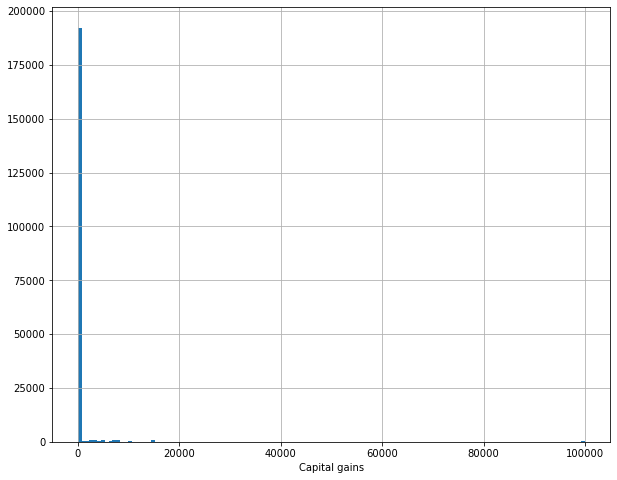

In [21]:
plt.figure(figsize=(10, 8))
new_income['capital gains'].hist(bins=new_income['capital gains'].nunique())
plt.xlabel('Capital gains')

In [22]:
# most of people has no capital gains

Text(0.5, 0, 'dividends from stocks')

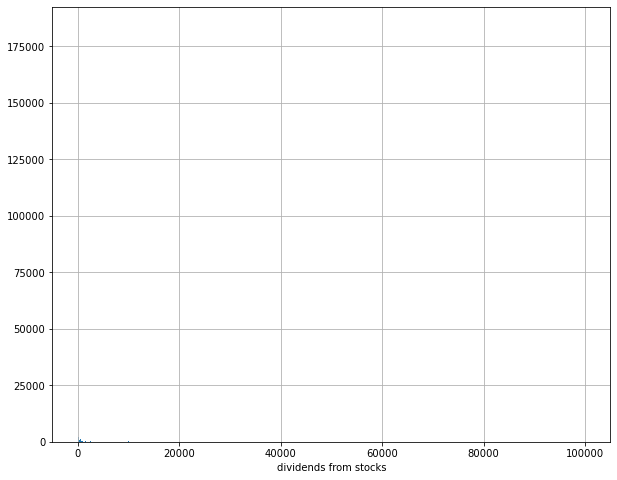

In [23]:
plt.figure(figsize=(10, 8))
new_income['dividends from stocks'].hist(bins=new_income['dividends from stocks'].nunique())
plt.xlabel('dividends from stocks')

Text(0.5, 0, 'weeks worked in year')

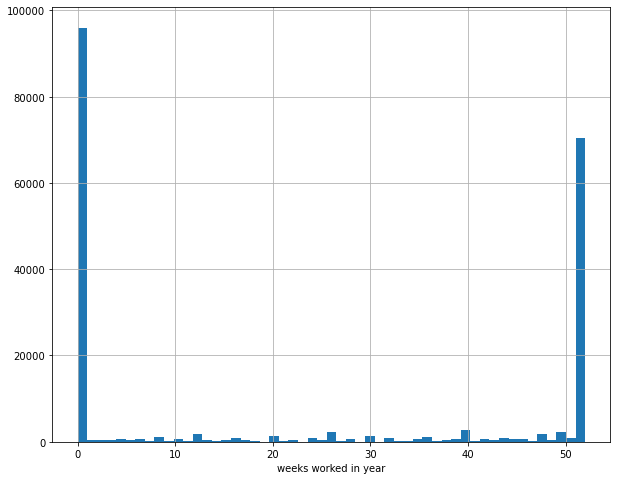

In [24]:
plt.figure(figsize=(10, 8))
new_income['weeks worked in year'].hist(bins=new_income['weeks worked in year'].nunique())
plt.xlabel('weeks worked in year')

D:\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



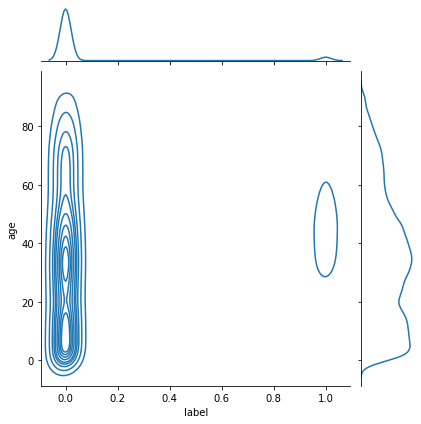

In [25]:
import seaborn as sns
sns.jointplot(new_income["label"], new_income['age'], kind='kde')

In [26]:
# people aged 30 to 60 are more likely to have a high annual income

D:\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



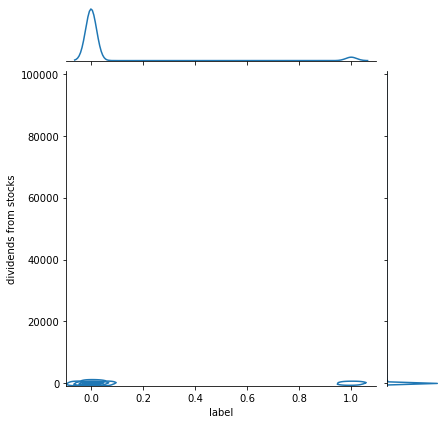

In [27]:
sns.jointplot(new_income["label"], new_income['dividends from stocks'], kind='kde')

D:\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



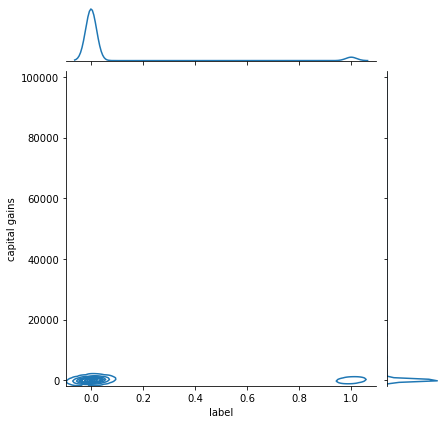

In [28]:
sns.jointplot(new_income["label"], new_income['capital gains'], kind='kde')

D:\Anaconda3\lib\site-packages\seaborn\_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



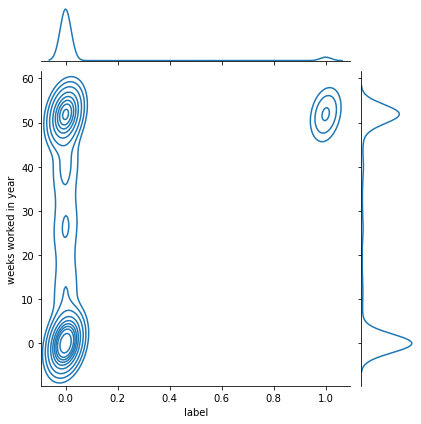

In [29]:
sns.jointplot(new_income["label"], new_income['weeks worked in year'], kind='kde')

In [30]:
# it's reasonable that people who work more weeks are more likely to earn more than $50,000 a year

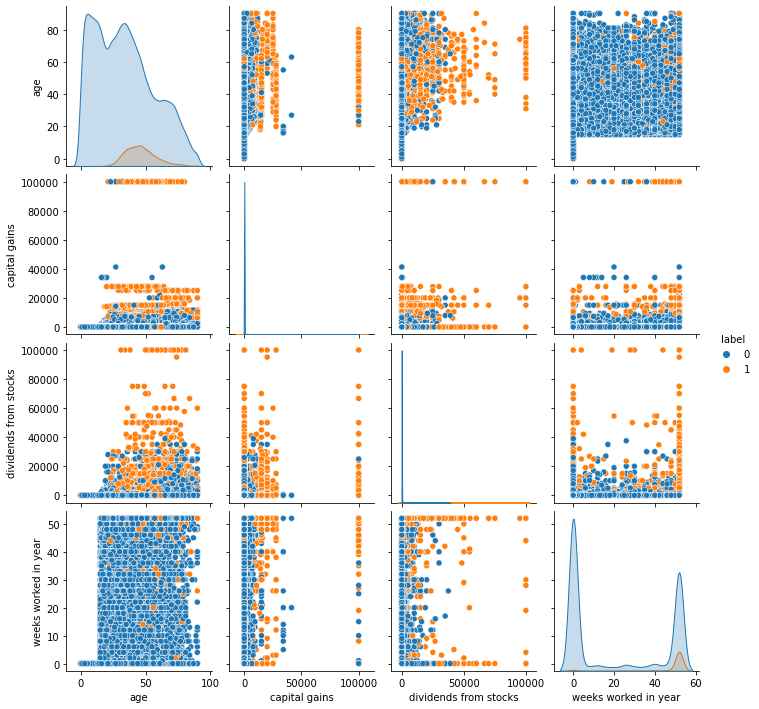

In [31]:
sns.pairplot(new_income, hue='label')

In [32]:
import plotly.express as px
fig = px.scatter_3d(
    new_income,
    x='dividends from stocks', 
    y='age', 
    z='capital gains', 
    color='label',
    opacity=0.8,
    height=700,
    width=700,
    title='Clusters in Age-education-weeks worked in year space',
    color_discrete_sequence=px.colors.qualitative.Set2
)
fig.show()

In [33]:
# I have tried several combinations of features, such as ('age', 'education', 'capital gains', 'dividends from stocks')
# but can not find a clearer segementation figure.

In [34]:
# as the dividends from stocks and capital gain increase, the more likely it is that the annual income is more than $50,000
# we can divide the data into 4 clusters, 
# cluster 1: capital gains >= 100k, annual income >= 50,000 dollars. 
# cluster 2: age < 20 years old, annual income < 50,000 dollars. 
# cluster 3: dividends from stocks >= 30k, 10k <= capital gains <= 30k, annual income >= $50,000. 
# cluster 4: dividends from stocks < 30k, capital gains < 10k, annual income < $50,000.

In [35]:
new_income.drop('weeks worked in year',axis=1, inplace=True)
new_income

D:\Anaconda3\lib\site-packages\pandas\core\frame.py:4174: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,age,capital gains,dividends from stocks,label
0,73,0,0,0
1,58,0,0,0
2,18,0,0,0
3,9,0,0,0
4,10,0,0,0
...,...,...,...,...
199518,87,0,0,0
199519,65,6418,9,0
199520,47,0,157,0
199521,16,0,0,0


In [36]:
# function to print score and confusion matrix
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

def print_score(clf, X_train, y_train, X_test, y_test, train=True):
    if train:
        pred = clf.predict(X_train)
        clf_report = pd.DataFrame(classification_report(y_train, pred, output_dict=True))
        print("Train Result:\n================================================")
        print(f"Accuracy Score: {accuracy_score(y_train, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_train, pred)}\n")
        
    elif train==False:
        pred = clf.predict(X_test)
        clf_report = pd.DataFrame(classification_report(y_test, pred, output_dict=True))
        print("Test Result:\n================================================")        
        print(f"Accuracy Score: {accuracy_score(y_test, pred) * 100:.2f}%")
        print("_______________________________________________")
        print(f"CLASSIFICATION REPORT:\n{clf_report}")
        print("_______________________________________________")
        print(f"Confusion Matrix: \n {confusion_matrix(y_test, pred)}\n")

In [37]:
# Reasons of using scikit-learn (not pandas) for ML preprocessing:
# Can cross-validate the entire workflow.
# Can grid search model & preprocessing hyperparameters.
# Avoids adding new columns to the source DataFrame.
# Pandas lacks separate fit/transform steps to prevent data leakage.

In [38]:
new_income['label'].value_counts()

0    187141
1     12382
Name: label, dtype: int64

In [39]:
# this is not a balanced dataset, the ratio of the positive examples and negative examples is around 1:15

In [40]:
# do up sample because this is not a balanced dataset
def up_sample(df, n):
    df1=df[df['label']==1]
    df2=df[df['label']==0]
    multi_df=[]
    for i in range(1, n):
        multi_df.append(df1)
    df3=pd.concat(multi_df,ignore_index=True)
    return pd.concat([df2,df3],ignore_index=True)

In [41]:
from sklearn.compose import make_column_transformer
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

# choose best up sample value,
# after testing, 11 is the best up_sample value
temp = new_income
temp = up_sample(temp, 11)

# split
X_train,X_test,y_train,y_test=train_test_split(temp[temp.columns[:3]],temp[temp.columns[3]],test_size=0.25,random_state=33, stratify=temp['label'])

num_columns = ['age', 'capital gains', 'dividends from stocks']
ct = make_column_transformer(
    (MinMaxScaler(), num_columns),
    (StandardScaler(), num_columns),
    remainder='passthrough'
)
X_train = ct.fit_transform(X_train)
X_test = ct.transform(X_test)

# Implimenting Logistic Regression in Scikit-Learn
lr_clf = LogisticRegression(solver='liblinear')
lr_clf.fit(X_train, y_train)
print_score(lr_clf, X_train, y_train, X_test, y_test, train=True)
print_score(lr_clf, X_train, y_train, X_test, y_test, train=False)

# Implimenting RandomForestClassifier in Scikit-Learn
# after testing, when n_estimators=1000, the model has the best performance
rf_clf = RandomForestClassifier(n_estimators=1000)
rf_clf.fit(X_train, y_train)
print_score(rf_clf, X_train, y_train, X_test, y_test, train=True)
print_score(rf_clf, X_train, y_train, X_test, y_test, train=False)

Train Result:
Accuracy Score: 64.77%
_______________________________________________
CLASSIFICATION REPORT:
                       0             1  accuracy      macro avg   weighted avg
precision       0.659714      0.604895  0.647719       0.632305       0.637886
recall          0.856343      0.332407  0.647719       0.594375       0.647719
f1-score        0.745277      0.429043  0.647719       0.587160       0.619357
support    140355.000000  92865.000000  0.647719  233220.000000  233220.000000
_______________________________________________
Confusion Matrix: 
 [[120192  20163]
 [ 61996  30869]]

Test Result:
Accuracy Score: 64.73%
_______________________________________________
CLASSIFICATION REPORT:
                      0             1  accuracy     macro avg  weighted avg
precision      0.658789      0.605307  0.647252      0.632048      0.637493
recall         0.858526      0.327928  0.647252      0.593227      0.647252
f1-score       0.745511      0.425395  0.647252      0.585

In [42]:
# the RandomForestClassifier has better performance